In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
from moviepy.editor import VideoFileClip
from IPython.display import HTML

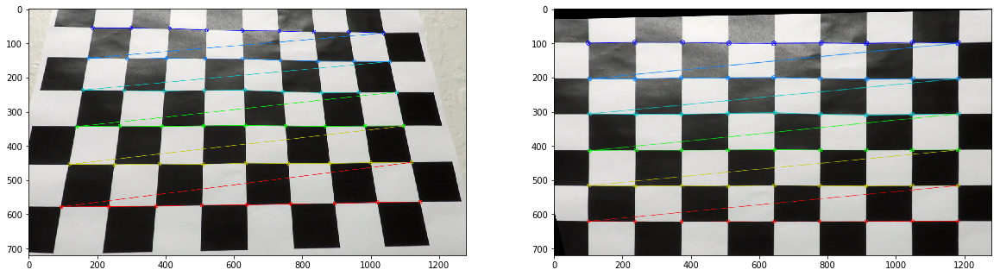

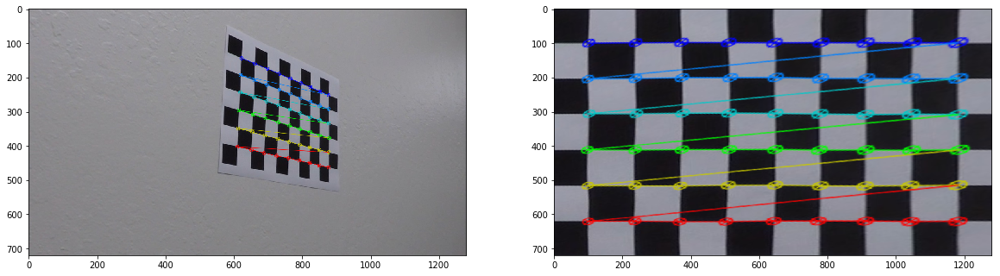

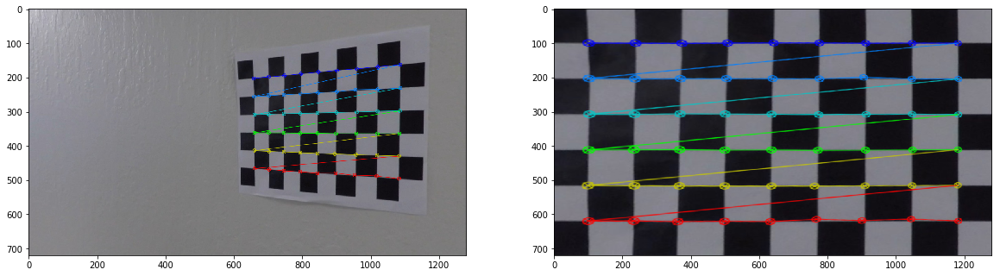

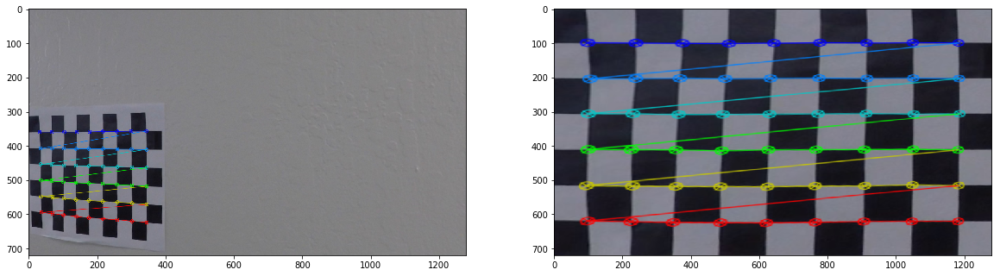

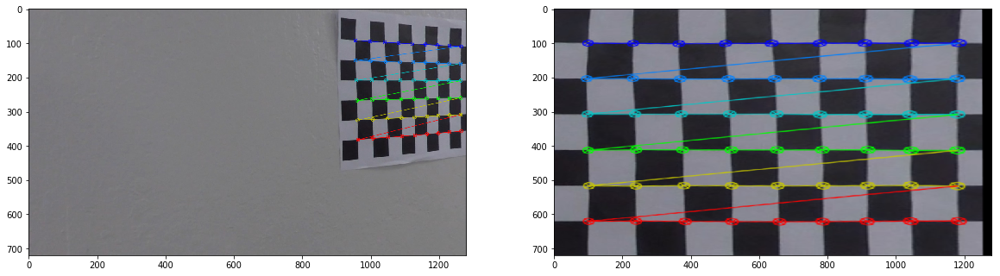

...

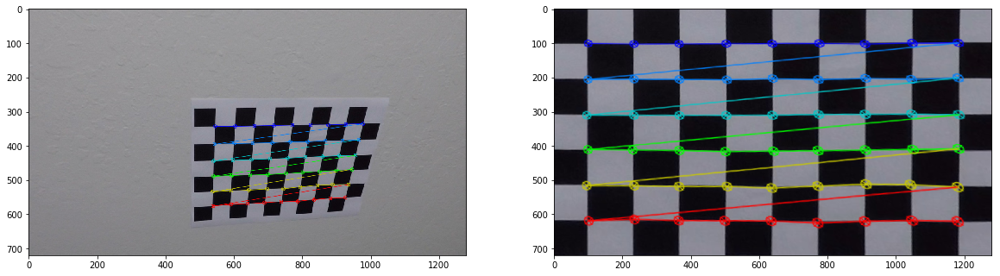

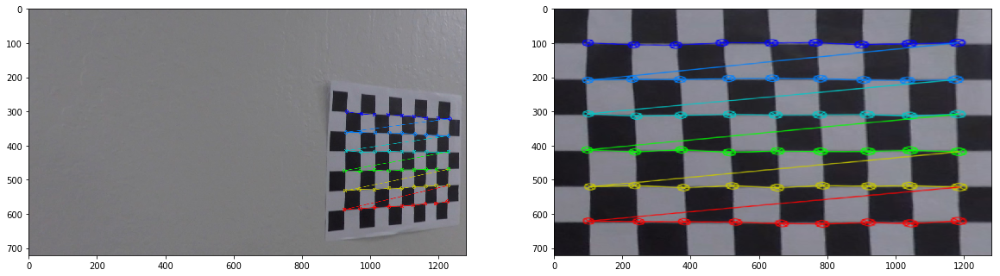

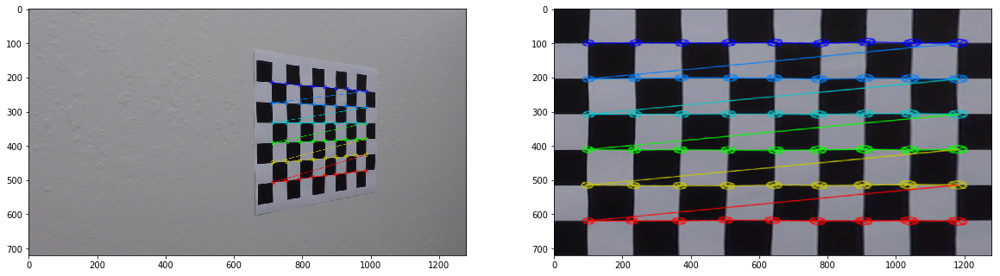

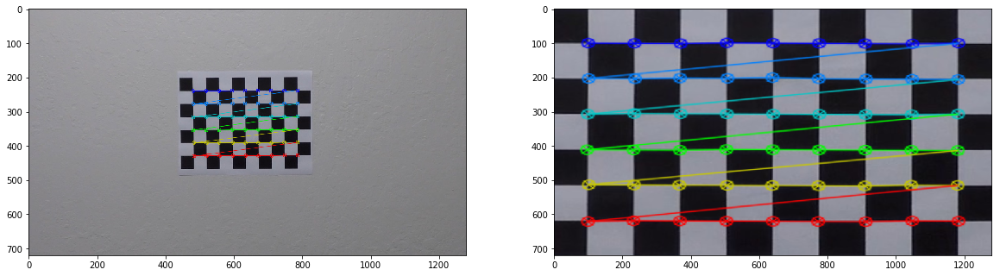

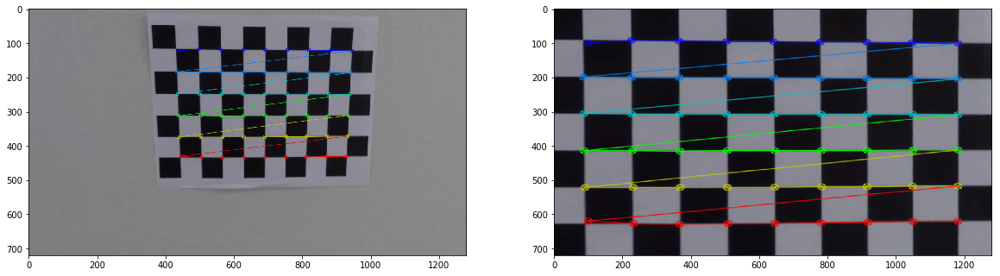

In [2]:
images = []
for image in os.listdir("camera_cal/"):
        images.append(mpimg.imread("camera_cal/" + image))

def calibcamera():
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
    for image in images:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
        if ret:
            return cv2.calibrateCamera([objp], [corners], gray.shape[::-1], None, None)

def corners_unwarp(undist, nx, ny, mtx, dist):
    gray = cv2.cvtColor(undist, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        offset = 100
        img_size = (gray.shape[1], gray.shape[0])
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(undist, M, img_size)
        return True, warped, M
    return False, 0, 0
        
ret, mtx, dist, rvecs, tvecs = calibcamera()
for image in images:
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    found, warp, M= corners_unwarp(undist, 9, 6, mtx, dist)
    if found:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(undist)
        ax2.imshow(warp, cmap='gray')

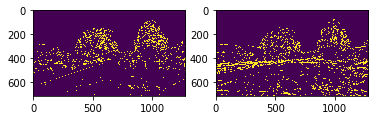

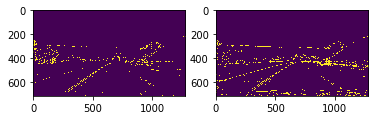

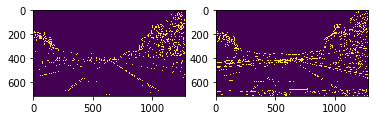

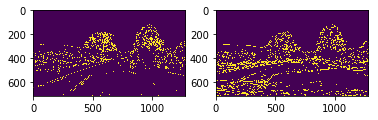

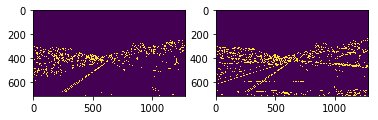

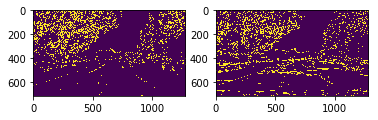

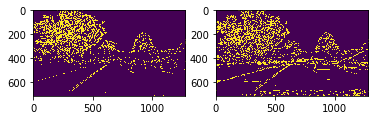

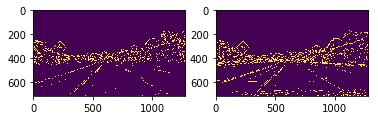

In [3]:
images = []
for image in os.listdir("test_images/"):
        images.append(mpimg.imread("test_images/" + image))

def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    return binary_output

for image in images:
    sobelx = abs_sobel_thresh(image, 'x', 20, 100)
    sobely = abs_sobel_thresh(image, 'y', 20, 100)
    plt.figure(1)
    plt.subplot(121)
    plt.imshow(sobelx)
    plt.subplot(122)
    plt.imshow(sobely)
    plt.show()

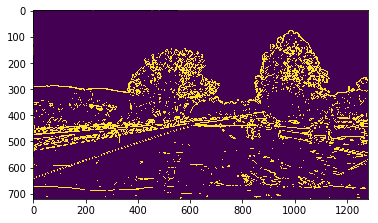

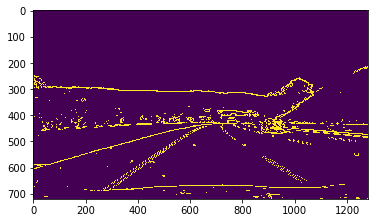

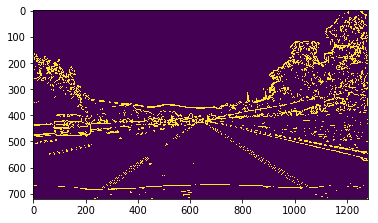

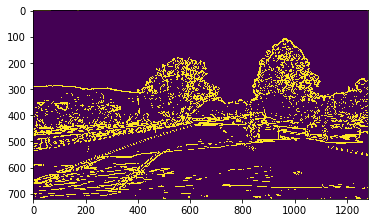

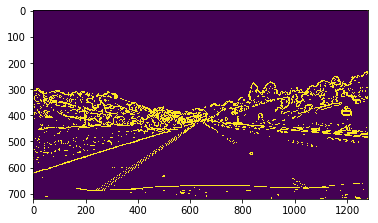

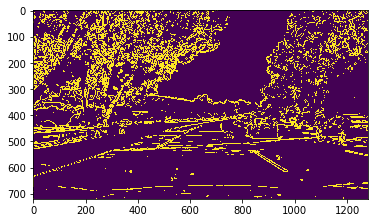

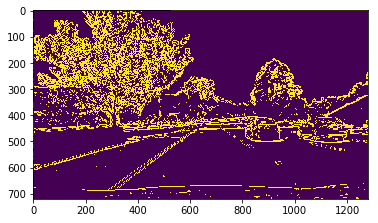

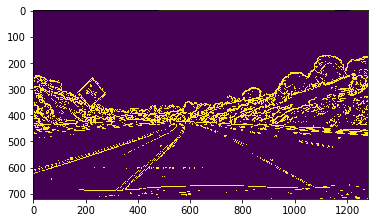

In [4]:
images = []
for image in os.listdir("test_images/"):
        images.append(mpimg.imread("test_images/" + image))

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    return binary_output

for image in images:
    magnitude = mag_thresh(image, 9, (30,100))
    plt.figure()
    plt.imshow(magnitude)

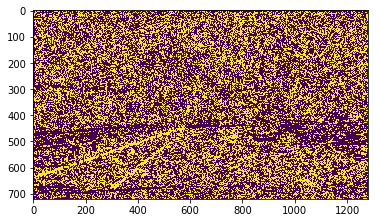

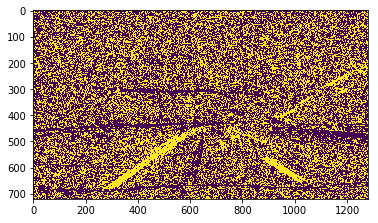

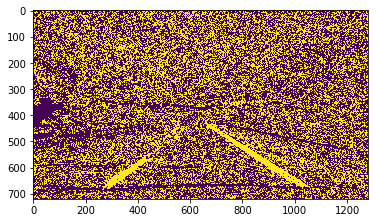

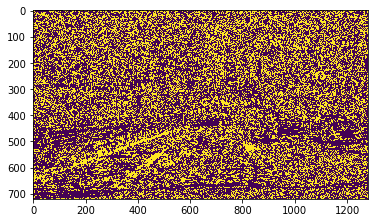

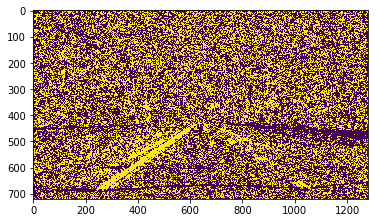

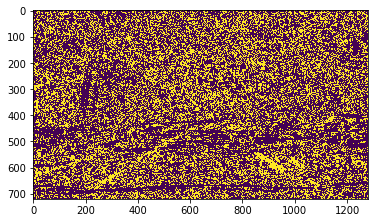

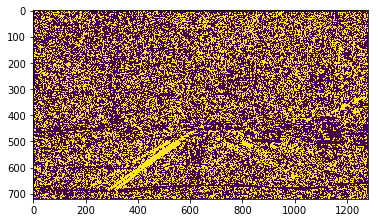

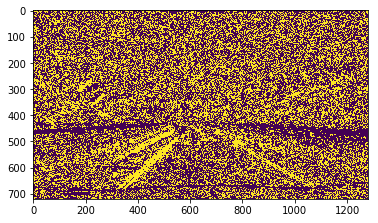

In [5]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output

for image in images:
    magnitude = dir_threshold(image, 15, (0.7, 1.3))
    plt.figure()
    plt.imshow(magnitude)

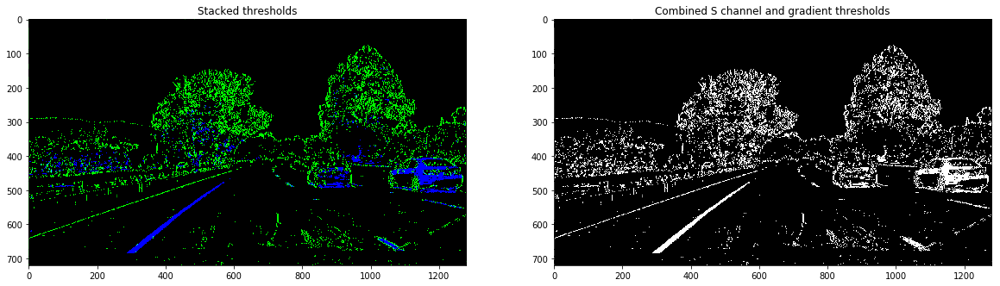

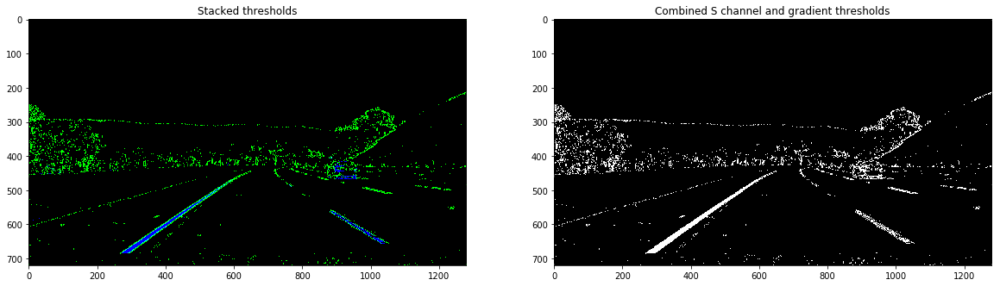

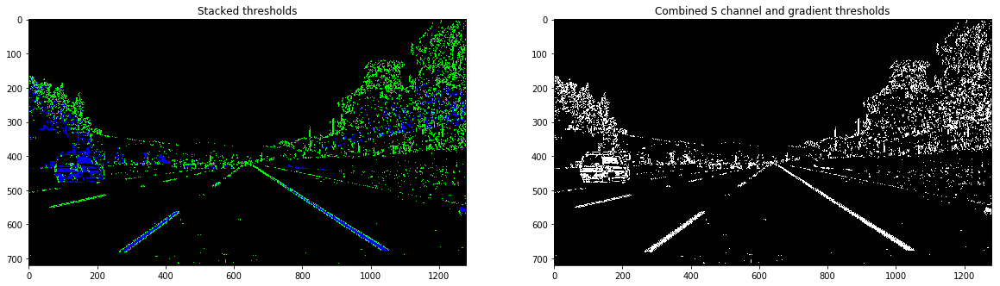

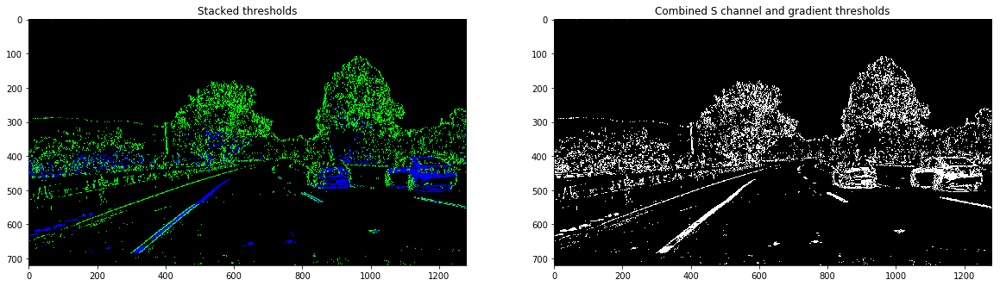

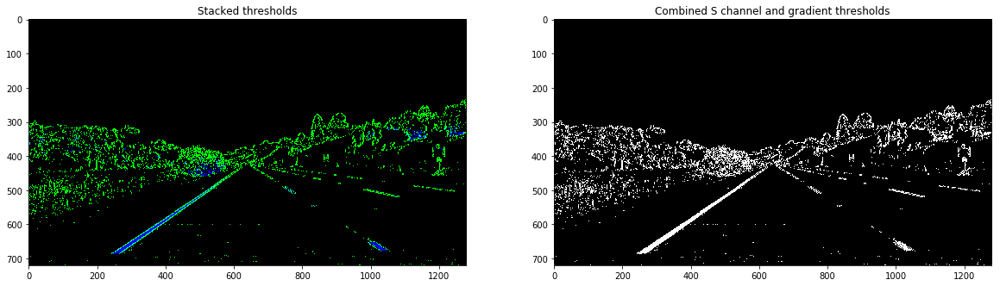

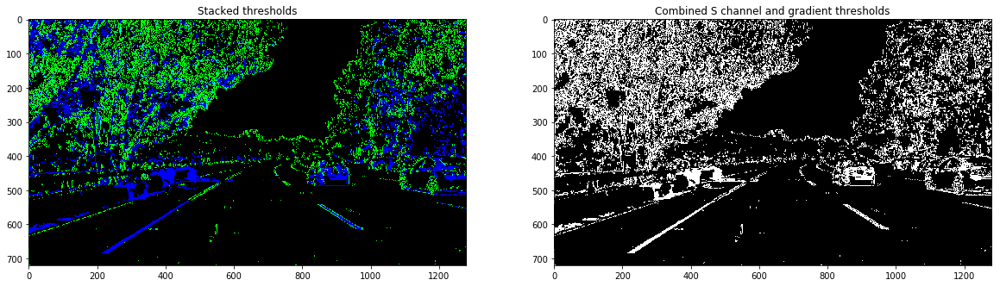

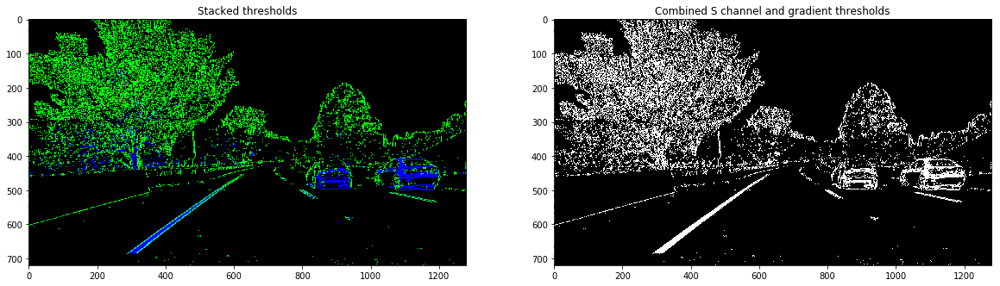

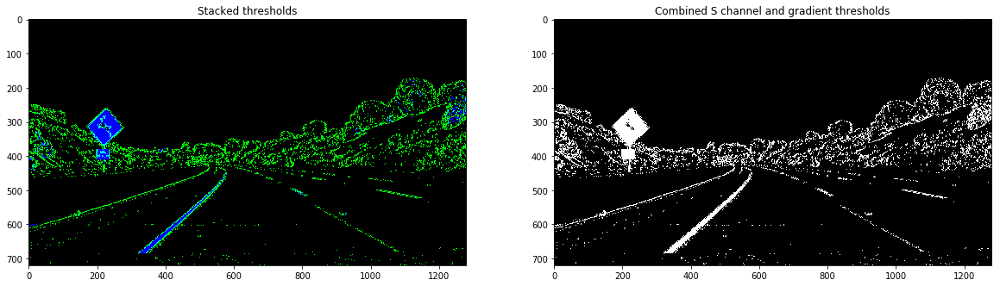

In [6]:
birdseye = []
for img in images:
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    birdseye.append(combined_binary)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Stacked thresholds')
    ax1.imshow(color_binary)

    ax2.set_title('Combined S channel and gradient thresholds')
    ax2.imshow(combined_binary, cmap='gray')

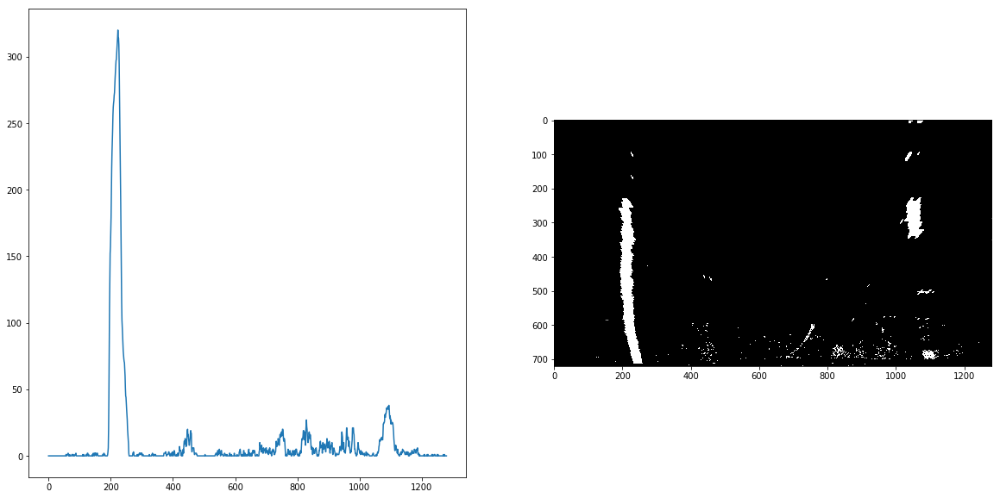

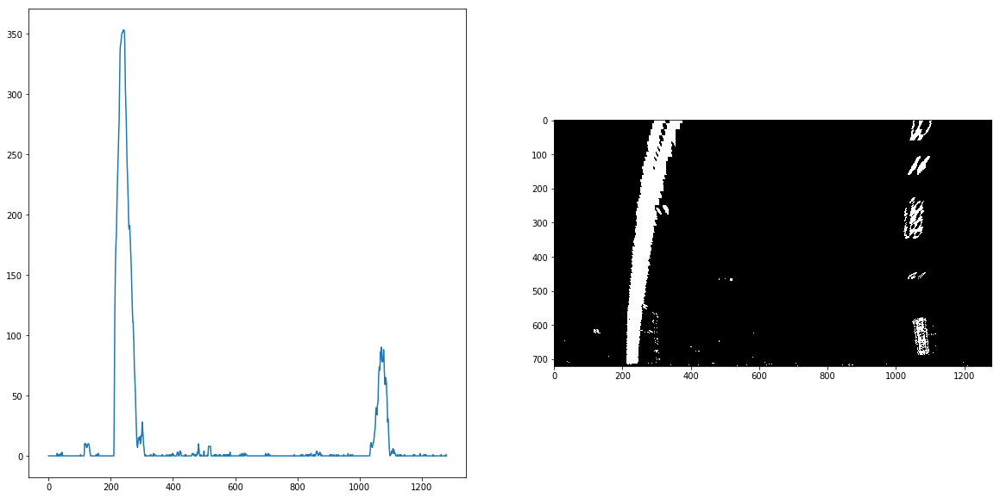

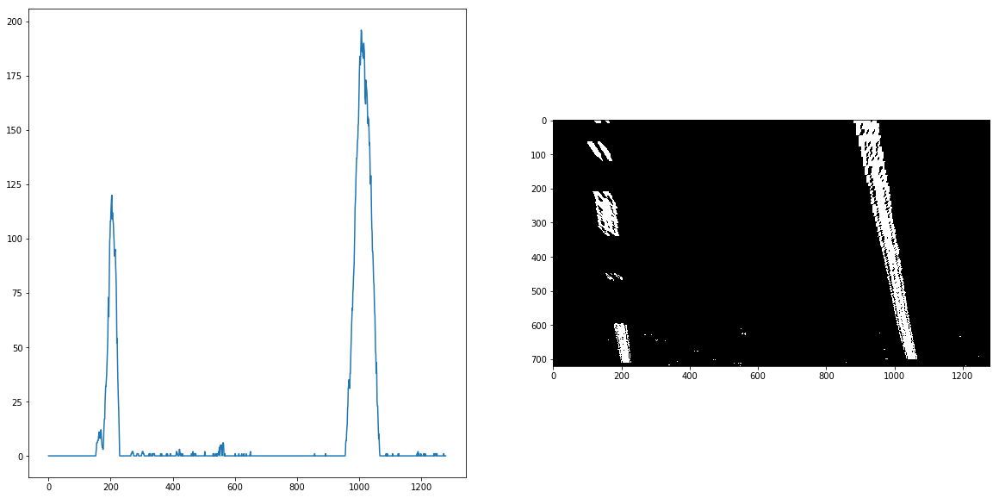

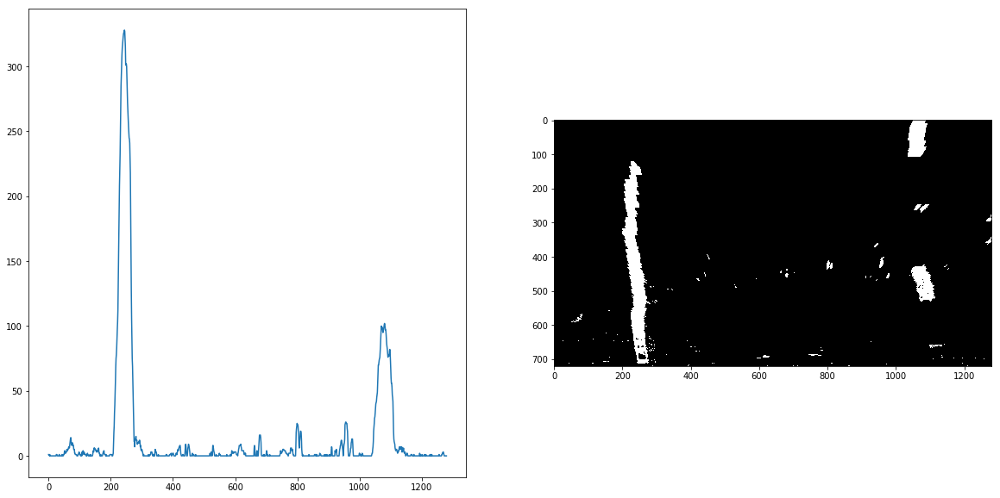

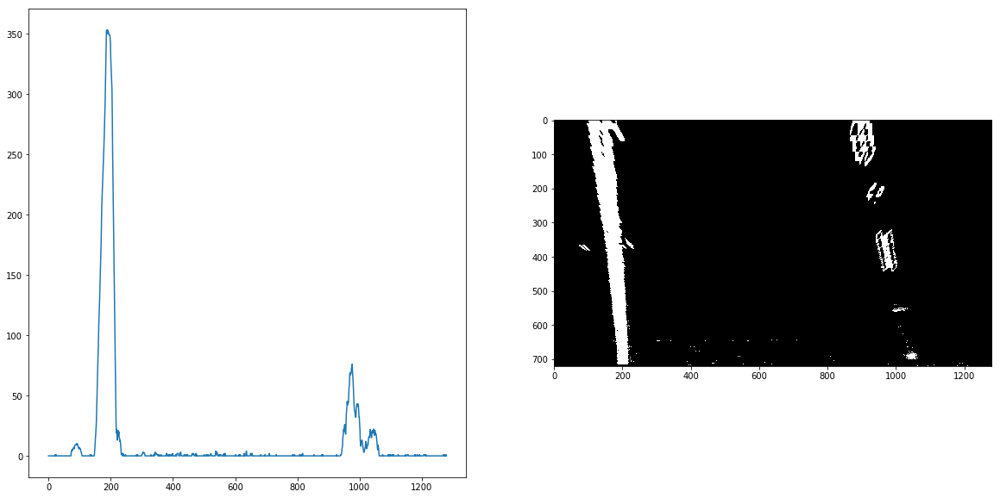

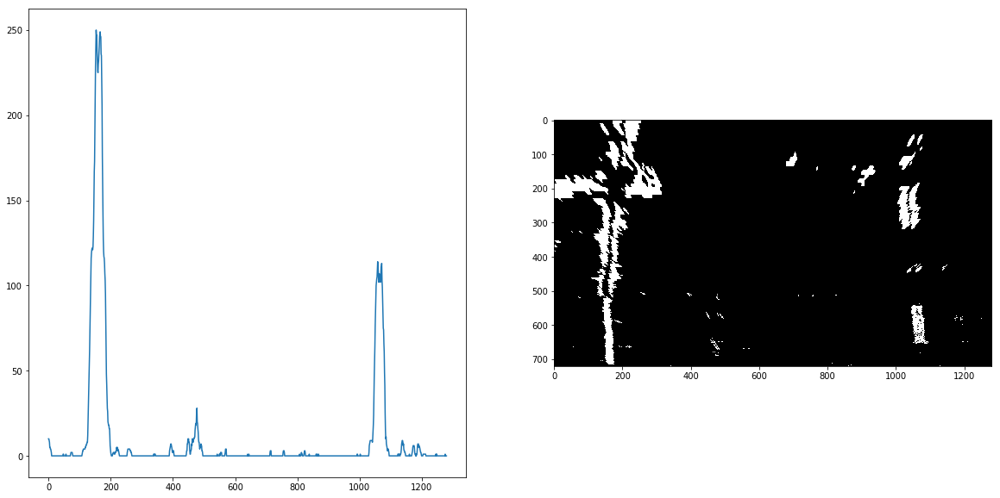

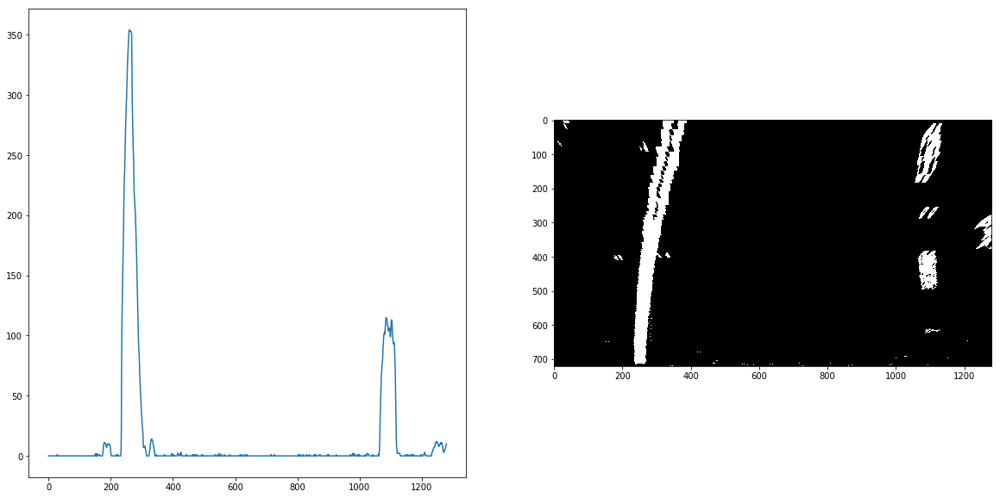

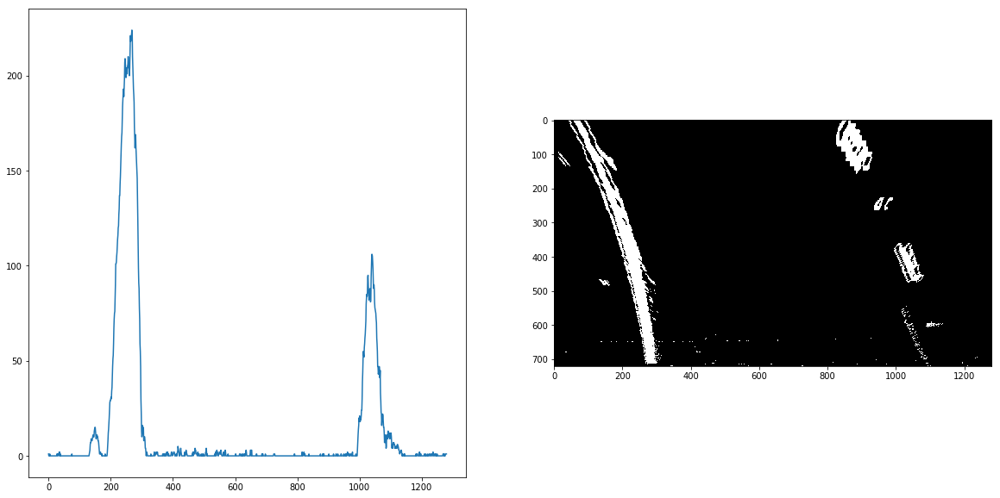

In [7]:
birdwarp = []
imwarp = []
def test(img):
    vertices = np.array([[[150, 720], [520, 460], [780, 460], [1200, 720]]])
    mask = np.zeros_like(img)   
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(img, mask)    
    return masked_image
i = 0
for img in birdseye:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    src = np.float32([[[280, 700], [600, 460], [730, 460], [1130, 720]]])
    dst = np.float32([[250, 720], [250, 0], [1070, 0], [1070, 720]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
    birdwarp.append(warped)
    imwarp.append(cv2.warpPerspective(images[i], M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR))
    i = i + 1
    ax2.imshow(warped, cmap='gray')
    ax1.plot(histogram)

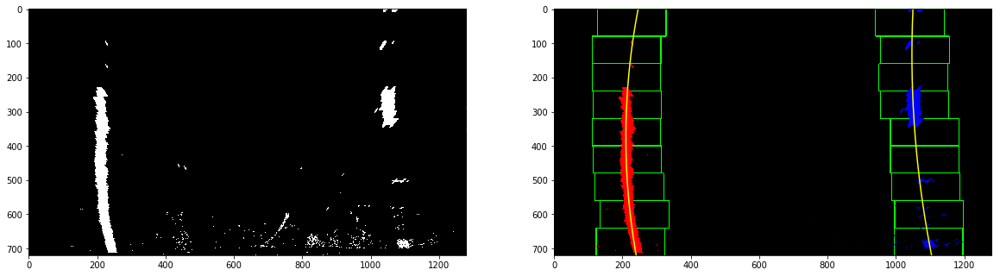

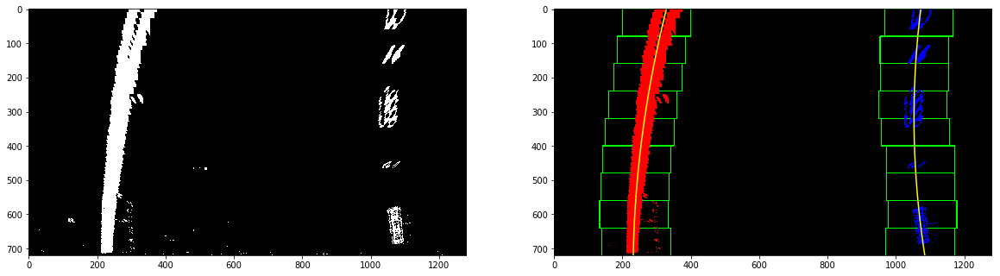

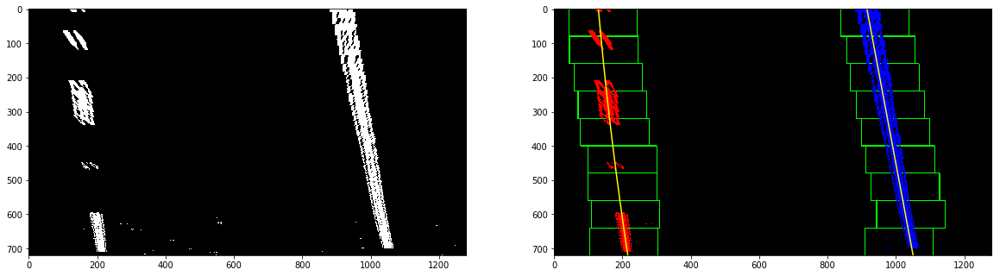

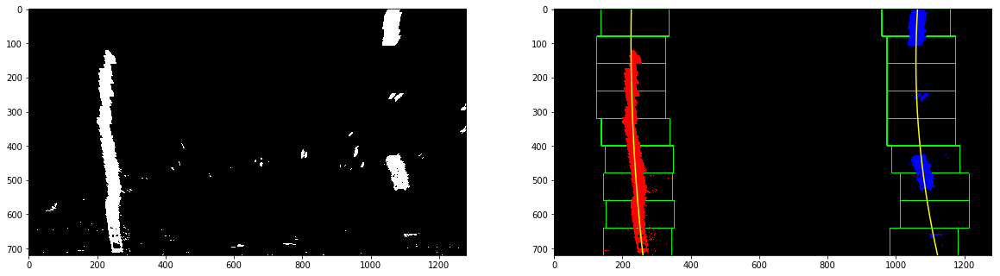

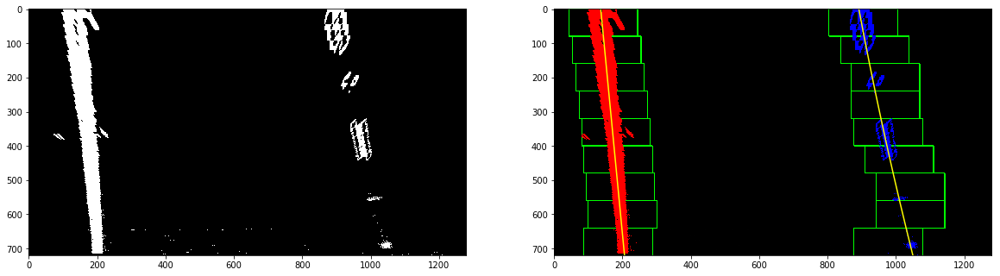

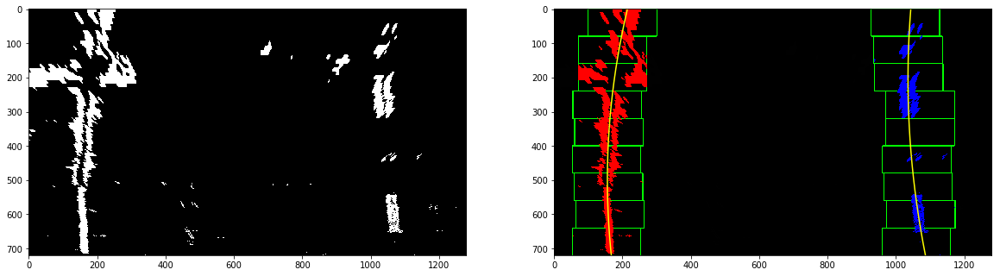

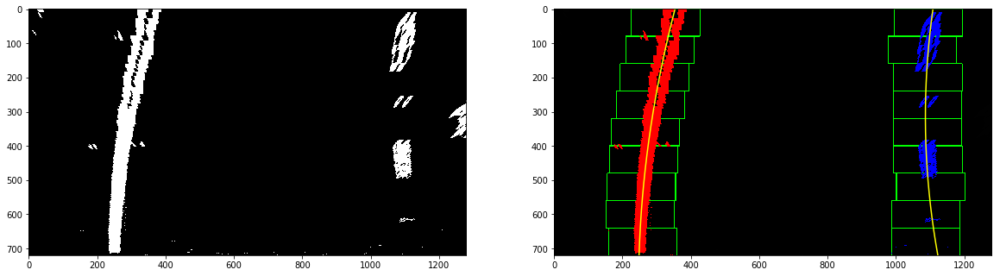

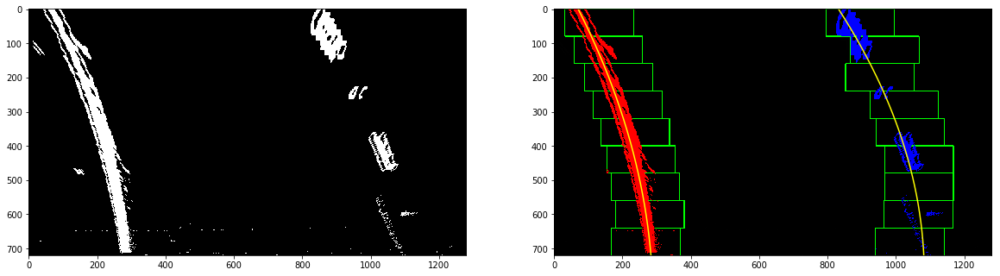

In [8]:
left_fit = []
right_fit = []

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit

for binary_warped in birdwarp:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    out_img,_,_ = fit_polynomial(binary_warped)
    ax1.imshow(binary_warped, cmap='gray')
    ax2.imshow(out_img, cmap='gray')

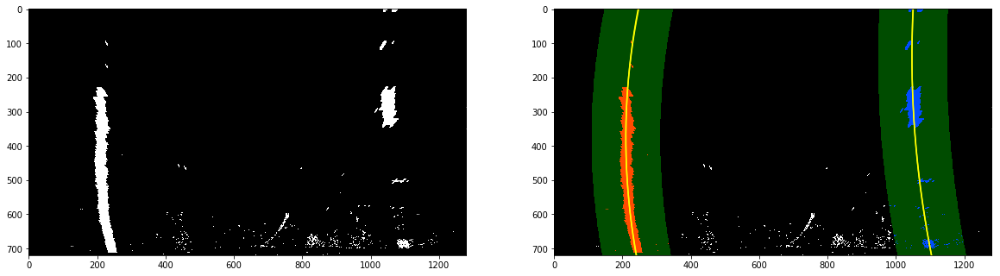

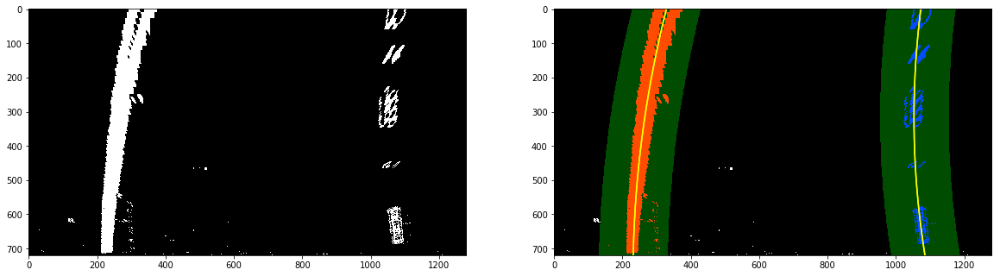

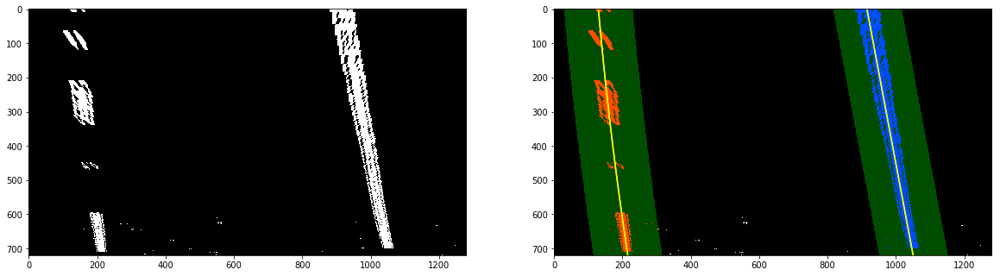

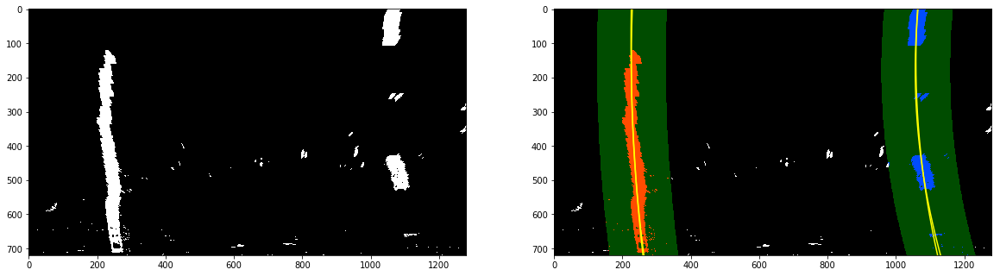

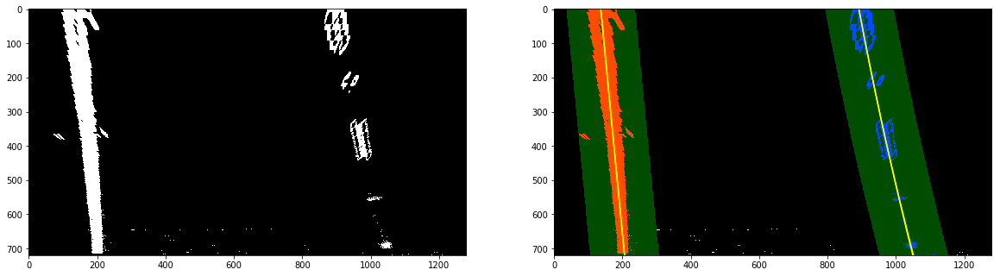

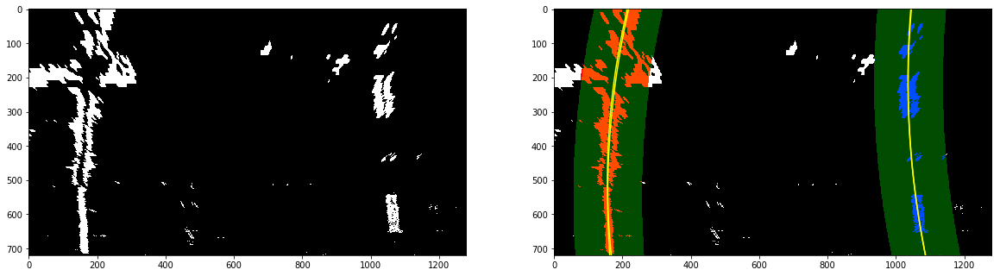

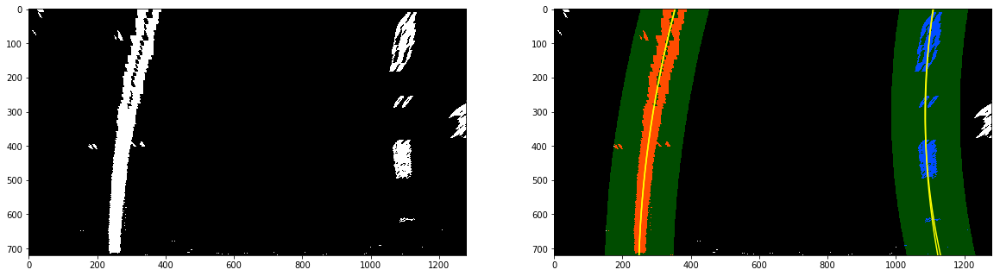

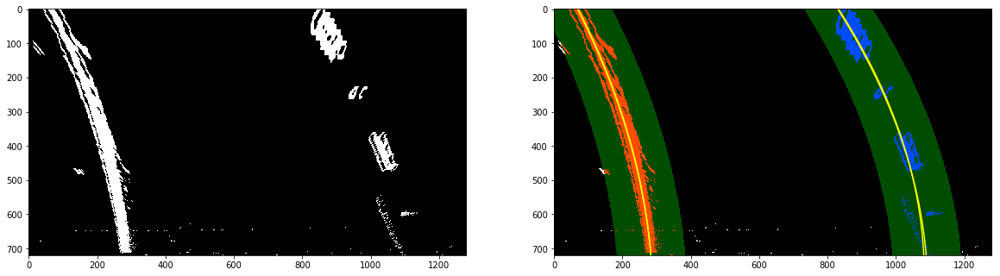

In [9]:
# Polynomial fit values from the previous frame
def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')    
    return result, (left_fitx, ploty), (right_fitx, ploty)

left = []
right = []
for binary_warped in birdwarp:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    out_img,left_fit,right_fit = fit_polynomial(binary_warped)
    out_img,l,r = search_around_poly(binary_warped, left_fit, right_fit)
    left.append(l)
    right.append(r)
    ax1.imshow(binary_warped, cmap='gray')
    ax2.imshow(out_img, cmap='gray')

radius of left curvature:  2060.08300943
radius of right curvature:  2991.38163442
radius of left curvature:  3374.7949749
radius of right curvature:  2611.66127591
radius of left curvature:  11635.3867425
radius of right curvature:  456938.407616
radius of left curvature:  5626.0509266
radius of right curvature:  2539.0988439
radius of left curvature:  8850621.30533
radius of right curvature:  12121.3726777
radius of left curvature:  2281.79799138
radius of right curvature:  2616.10445516
radius of left curvature:  3458.74657808
radius of right curvature:  2309.87705066
radius of left curvature:  2354.51139556
radius of right curvature:  1967.32170636


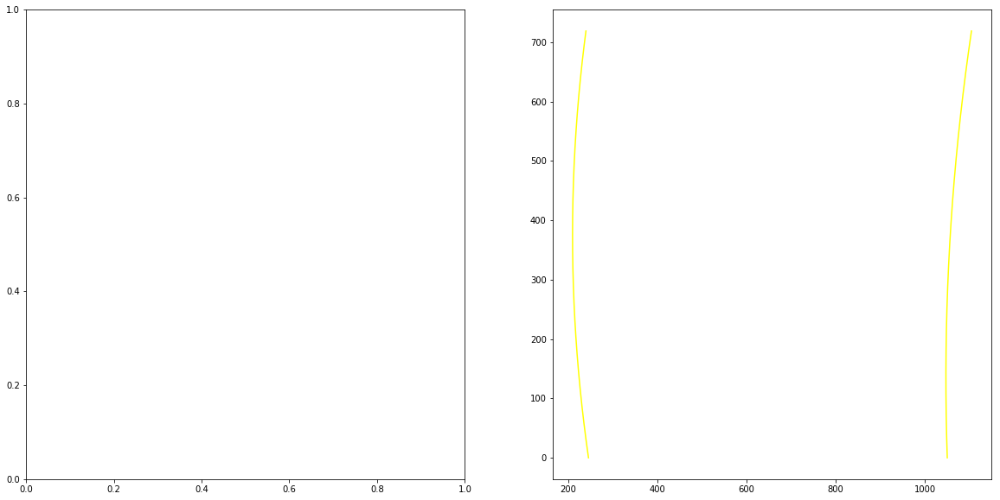

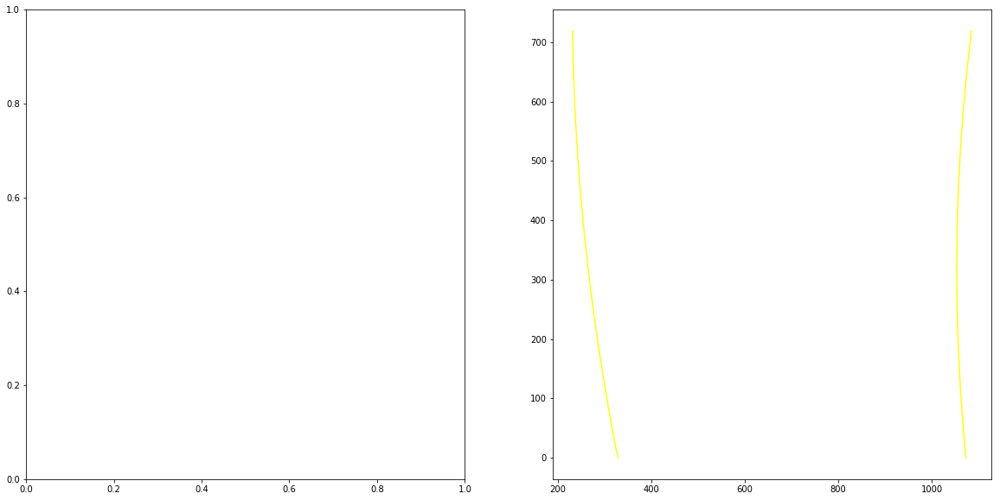

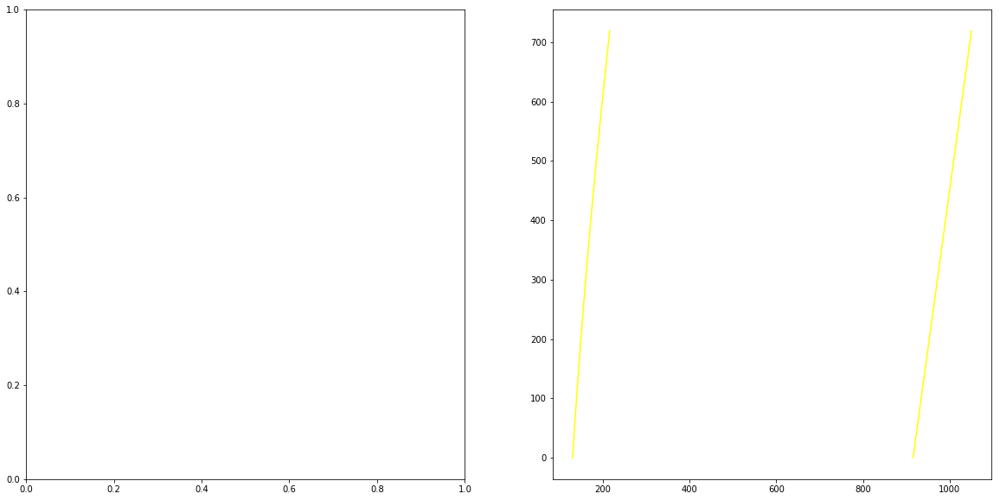

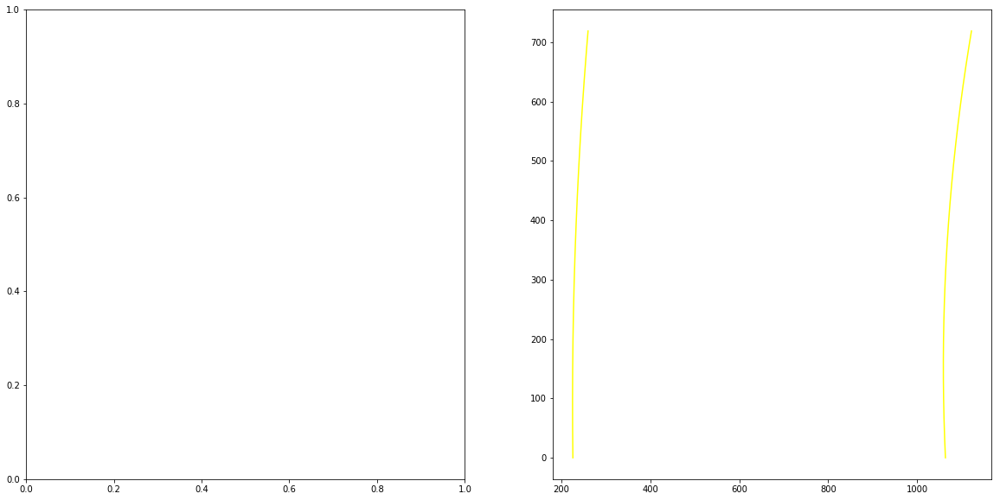

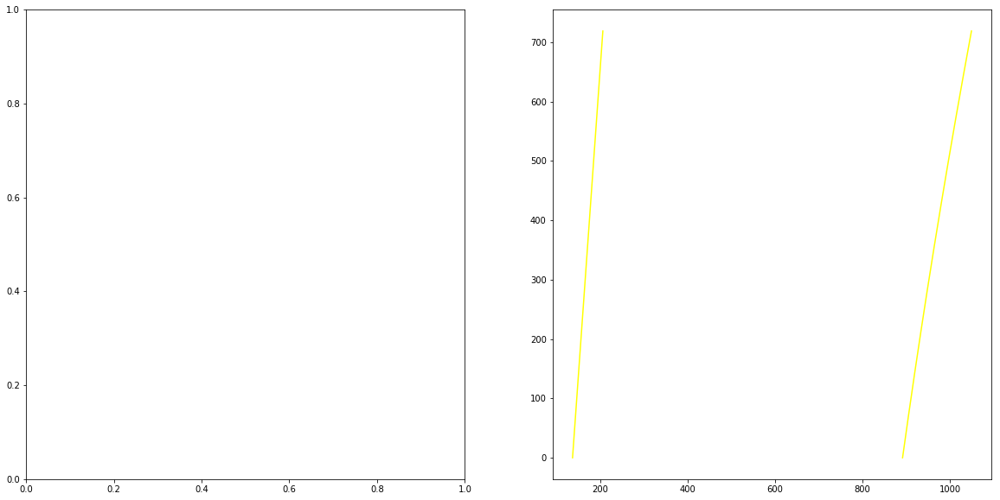

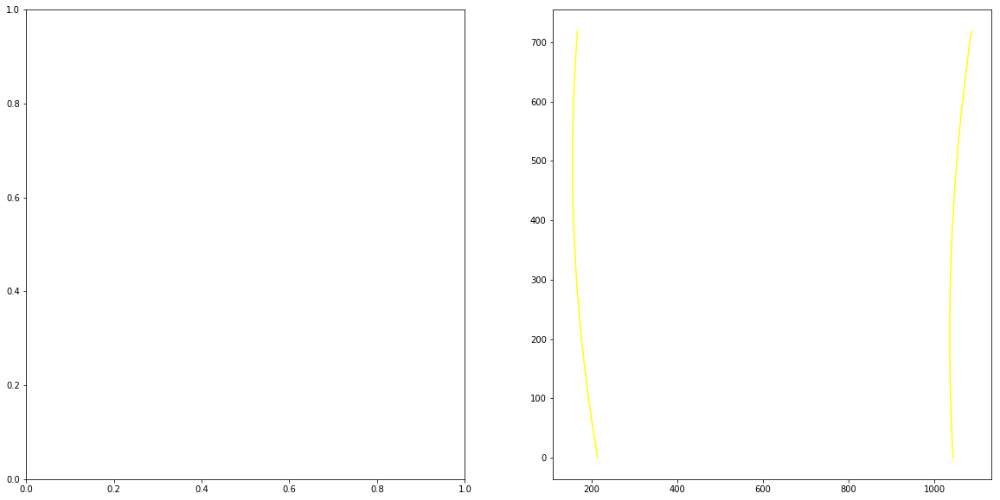

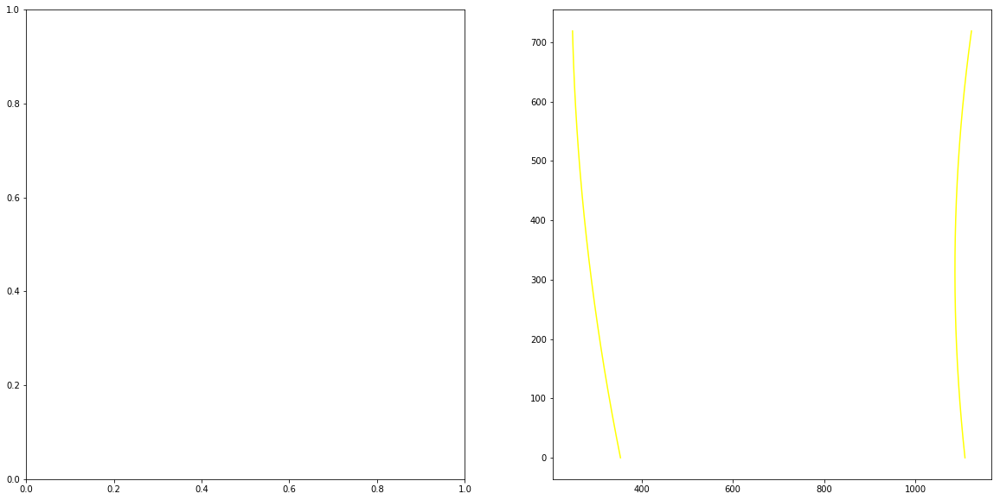

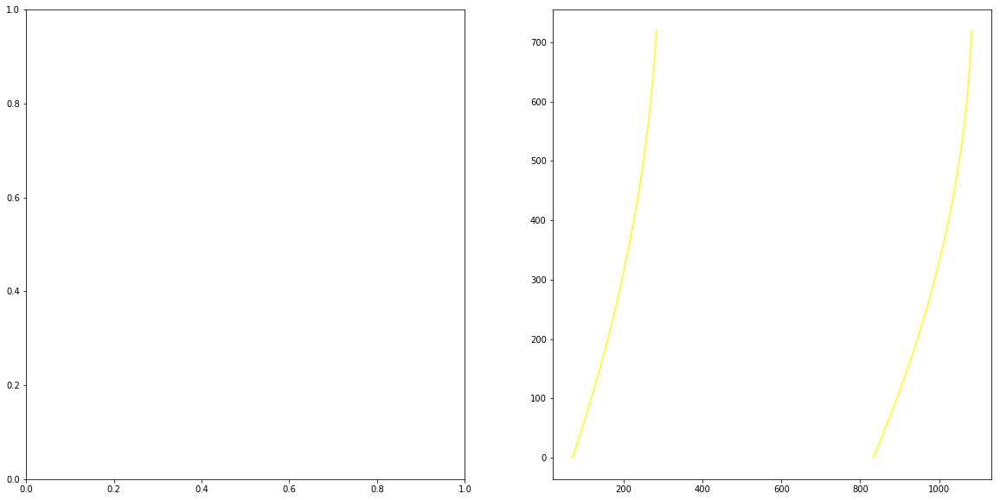

In [10]:
def measure_curvature_real(left_fit_cr, right_fit_cr):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    ploty = np.linspace(0, 719, num=720)
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
    return left_curverad, right_curverad

for binary_warped in birdwarp:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    out_img,left_fit,right_fit = fit_polynomial(binary_warped)
    left_curverad, right_curverad = measure_curvature_real(left_fit, right_fit)
    print('radius of left curvature: ',left_curverad)
    print('radius of right curvature: ',right_curverad)


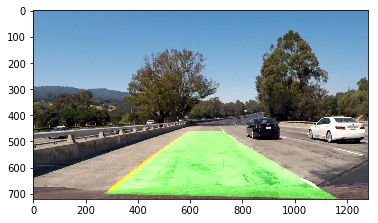

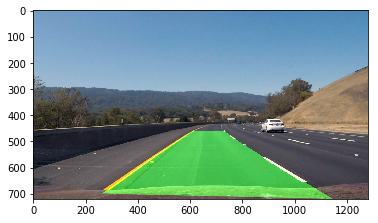

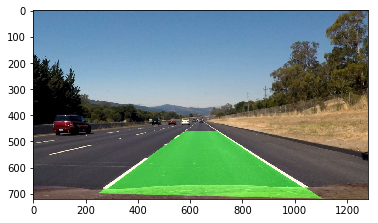

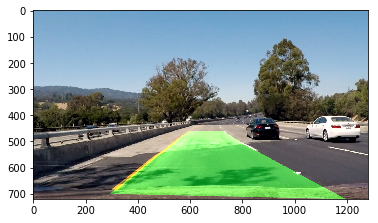

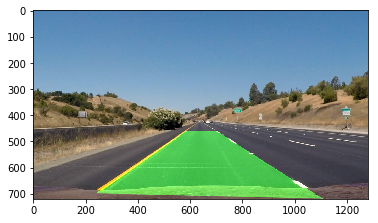

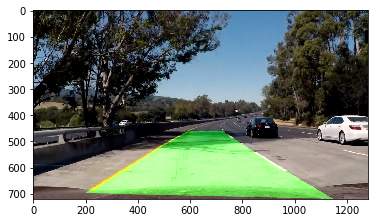

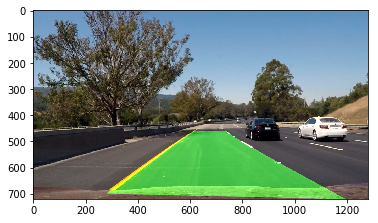

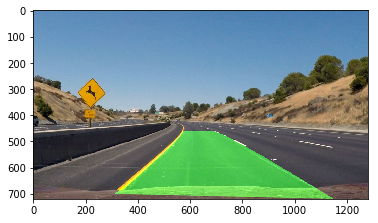

In [11]:
i = 0
#print(np.array([np.transpose(np.vstack([left[0]]))]).astype(np.int32))
for im in imwarp:
    color_warp = np.zeros_like(im)
    #color_warp = cv2.polylines(color_warp,np.array([np.transpose(np.vstack([left[i]]))]).astype(np.int32),True,(0,255,0), 100)
    #color_warp = cv2.polylines(color_warp,np.array([np.transpose(np.vstack([right[i]]))]).astype(np.int32),True,(0,255,0), 100)
    arr1 = np.array([np.transpose(np.vstack([left[i][0], left[i][1]]))])
    arr2 = np.array([np.flipud(np.transpose(np.vstack([right[i][0], right[i][1]])))])
    res = np.hstack((arr1, arr2))
    cv2.fillPoly(color_warp, np.int_([res]), (0,255, 0))
    warpback = cv2.warpPerspective(color_warp, Minv, (im.shape[1], im.shape[0]))
    weight = cv2.addWeighted(images[i], 1, warpback, 0.5, 0)
    i = i + 1
    plt.figure()
    plt.imshow(weight)

[MoviePy] >>>> Building video ./result_video.mp4
[MoviePy] Writing video ./result_video.mp4


100%|█████████▉| 1260/1261 [05:07<00:00,  3.90it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./result_video.mp4 

CPU times: user 2min 40s, sys: 13.4 s, total: 2min 54s
Wall time: 5min 10s


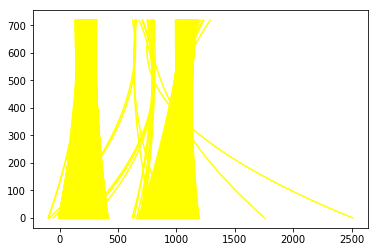

In [12]:
prevres = []
def process_video(img):
    global prevres
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    src = np.float32([[[280, 700], [600, 460], [730, 460], [1130, 720]]])
    dst = np.float32([[250, 720], [250, 0], [1070, 0], [1070, 720]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(combined_binary, M, (combined_binary.shape[1], combined_binary.shape[0]), flags=cv2.INTER_LINEAR)
    im = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

    out_img,left_fit,right_fit = fit_polynomial(warped)
    out_img,l,r = search_around_poly(warped, left_fit, right_fit)

    color_warp = np.zeros_like(im)
    arr1 = np.array([np.transpose(np.vstack([l[0], l[1]]))])
    arr2 = np.array([np.flipud(np.transpose(np.vstack([r[0], r[1]])))])
    res = np.hstack((arr1, arr2))
    left_curverad, right_curverad = measure_curvature_real(left_fit, right_fit)
    if abs(left_curverad - right_curverad) < 900 or abs(left_curverad - right_curverad) > 2013:
        res = prevres

    cv2.fillPoly(color_warp, np.int_([res]), (0,255, 0))
    warpback = cv2.warpPerspective(color_warp, Minv, (im.shape[1], im.shape[0]))
    weight = cv2.addWeighted(img, 1, warpback, 0.5, 0)

    carmid = img.shape[1]/2
    linemid = (left_fit + right_fit) / 2
    carpos = (carmid - linemid) * 3.7/700

    cv2.putText(weight, "left curve: {}".format(left_curverad),(100,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2)
    cv2.putText(weight, "right curve: {}".format(right_curverad),(100,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2)
    cv2.putText(weight, "carpos: {}".format(carpos[2]),(100,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2)
    prevres = res
    return weight

output = './result_video.mp4'
clip1 = VideoFileClip("./project_video.mp4")
white_clip = clip1.fl_image(process_video)
%time white_clip.write_videofile(output, audio=False)

In [14]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))